# **Exploratory Data Analysis - Electric Vehicle Charging Stations**

Electric Vehicle Charging stations dataset is the  key driver for the project to understand the current infrastructure of EV Charging stations across US and Canada. This dataset contains alternate EV Charging stations details for the past 10 years.

Dataset Downloaded from [AFDC Site](https://afdc.energy.gov/fuels/electricity_locations.html#/analyze?fuel=ELEC)

**This dataset has US and Canada regional coverage**

**This dataset contains ONLY Public charging stations**

MetaData available [here](https://developer.nrel.gov/docs/transportation/alt-fuel-stations-v1/all/)

In [2]:
#Install libraries if needed , uncomment below statement and execute

#pip install geopandas
#pip install folium

In [3]:
#Importing libraries needed for EDA

import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import altair as alt

import geopandas

# Suppress all warnings
import warnings
warnings.filterwarnings('ignore')


import folium

from branca.element import Template, MacroElement


alt.themes.enable('fivethirtyeight')

ThemeRegistry.enable('fivethirtyeight')

In [4]:
#Loading the EV Charging Station CSV file into Pandas Dataframe
evcs_all = pd.read_csv("assets/alt_fuel_stations.csv")

In [5]:
#Let's take look at the columns in the dataset
evcs_all.columns

Index(['Fuel Type Code', 'Station Name', 'Street Address',
       'Intersection Directions', 'City', 'State', 'ZIP', 'Plus4',
       'Station Phone', 'Status Code', 'Expected Date',
       'Groups With Access Code', 'Access Days Time', 'Cards Accepted',
       'BD Blends', 'NG Fill Type Code', 'NG PSI', 'EV Level1 EVSE Num',
       'EV Level2 EVSE Num', 'EV DC Fast Count', 'EV Other Info', 'EV Network',
       'EV Network Web', 'Geocode Status', 'Latitude', 'Longitude',
       'Date Last Confirmed', 'ID', 'Updated At', 'Owner Type Code',
       'Federal Agency ID', 'Federal Agency Name', 'Open Date',
       'Hydrogen Status Link', 'NG Vehicle Class', 'LPG Primary',
       'E85 Blender Pump', 'EV Connector Types', 'Country',
       'Intersection Directions (French)', 'Access Days Time (French)',
       'BD Blends (French)', 'Groups With Access Code (French)',
       'Hydrogen Is Retail', 'Access Code', 'Access Detail Code',
       'Federal Agency Code', 'Facility Type', 'CNG Dispenser N

In [6]:
#Checking the sample data
evcs_all.head()

,Fuel Type Code,Station Name,Street Address,Intersection Directions,City,State,ZIP,Plus4,Station Phone,Status Code,...,EV Pricing (French),LPG Nozzle Types,Hydrogen Pressures,Hydrogen Standards,CNG Fill Type Code,CNG PSI,CNG Vehicle Class,LNG Vehicle Class,EV On-Site Renewable Source,Restricted Access
0,ELEC,Los Angeles Convention Center,1201 S Figueroa St,West hall and South hall,Los Angeles,CA,90015,NaN,213-741-1151,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ELEC,California Air Resources Board,9530 Telstar Ave,NaN,El Monte,CA,91731,NaN,626-575-6800,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ELEC,Scripps Green Hospital,10666 N Torrey Pines Rd,"Patient Parking Structure, level G",La Jolla,CA,92037,NaN,NaN,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ELEC,San Diego Wild Animal Park,15500 San Pasqual Valley Rd,NaN,Escondido,CA,92027,NaN,760-747-8702,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ELEC,Galpin Motors,15421 Roscoe Blvd,NaN,Sepulveda,CA,91343,NaN,800-256-6219,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Time to see some of high level counts 

In [7]:
count = len(evcs_all)
print("There are {} EV charging stations in the US and Canada as of July 30 2021".format(count)) 

There are 49470 EV charging stations in the US and Canada as of July 30 2021


In [8]:
#Dataframe for US EV Charge Stations
us_evcs = evcs_all[evcs_all['Country'] == 'US']

In [9]:
us_count = len(us_evcs)
print("There are {} EV charging stations in the United States as of July 30 2021".format(us_count)) 

There are 43289 EV charging stations in the United States as of July 30 2021


In [10]:
ca_count = len(evcs_all[evcs_all['Country'] == 'CA'])
print("There are {} EV charging stations in the United States as of July 30 2021".format(ca_count)) 

There are 6181 EV charging stations in the United States as of July 30 2021


# **Basic Visualization**

We have used matplotlib to create some basic vislization and altair libraries to visualize the data further in details.

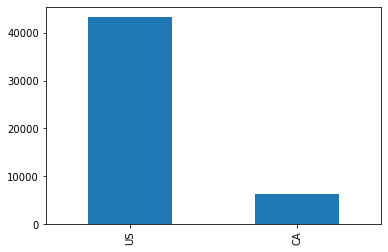

In [11]:
evcs_all['Country'].value_counts().plot(kind='bar')

### US EV Charging Stations by EV Network

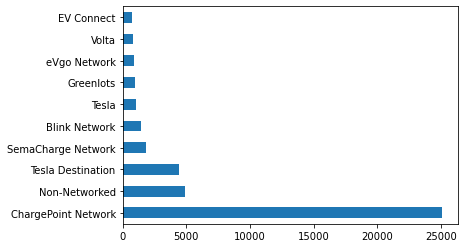

In [12]:
us_evcs['EV Network'].value_counts()[:10].plot(kind='barh')

As we see in the bar chart above, CharePoint is leading the way in number of EV Charging Stations across US ans Tesla as an OEM is at 3rd place after the Non-networked which are mostly Government owned stations.

### US EV Charging Stations by Facility Type

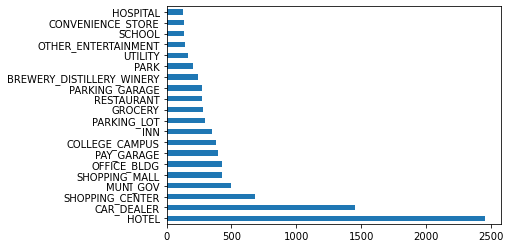

In [13]:
us_evcs['Facility Type'].value_counts()[:20].plot(kind='barh')

### EV Charging Stations opened by Year

In [14]:
#Adding a year column from Open Date field
us_evcs['year_opened'] = pd.DatetimeIndex(us_evcs['Open Date']).year

In [15]:
# Filling NaNs to 0
us_evcs['year_opened'] = us_evcs['year_opened'].fillna(0)

In [16]:
# Converting the data type to integer
us_evcs['year_opened'] = us_evcs['year_opened'].astype('int')

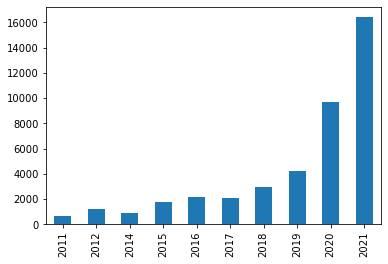

In [17]:
us_evcs['year_opened'].value_counts()[:10].sort_index().plot(kind='bar')

### EV Charging Stations by States

Let's take a look at the data by States

In [18]:
#Dataframe for charging stations by State
evcs_by_state = us_evcs.groupby('State').size().reset_index(name='station_count').sort_values(by='station_count', ascending=False).reset_index(drop=True)

#Creating a dictionary for State name Mapping
states_mapping = {"AL":"Alabama","AK":"Alaska","AZ":"Arizona","AR":"Arkansas","CA":"California","CO":"Colorado","CT":"Connecticut","DE":"Delaware",\
          "FL":"Florida","GA":"Georgia","HI":"Hawaii","ID":"Idaho","IL":"Illinois","IN":"Indiana","IA":"Iowa","KS":"Kansas","KY":"Kentucky",\
          "LA":"Louisiana","ME":"Maine","MD":"Maryland","MA":"Massachusetts","MI":"Michigan","MN":"Minnesota","MS":"Mississippi","MO":"Missouri",\
          "MT":"Montana","NE":"Nebraska","NV":"Nevada","NH":"New Hampshire","NJ":"New Jersey","NM":"New Mexico","NY":"New York","NC":"North Carolina",\
          "ND":"North Dakota","OH":"Ohio","OK":"Oklahoma","OR":"Oregon","PA":"Pennsylvania","RI":"Rhode Island","SC":"South Carolina","SD":"South Dakota",\
          "TN":"Tennessee","TX":"Texas","UT":"Utah","VT":"Vermont","VA":"Virginia","WA":"Washington","WV":"West Virginia","WI":"Wisconsin","WY":"Wyoming",\
         "PR":"Puerto Rico", "DC":"District of Columbia"}

evcs_by_state['State_Name'] = evcs_by_state.State.map(states_mapping)
evcs_by_state.head()


,State,station_count,State_Name
0,CA,13094,California
1,NY,2566,New York
2,FL,2245,Florida
3,TX,2071,Texas
4,MA,1788,Massachusetts


<BarContainer object of 52 artists>

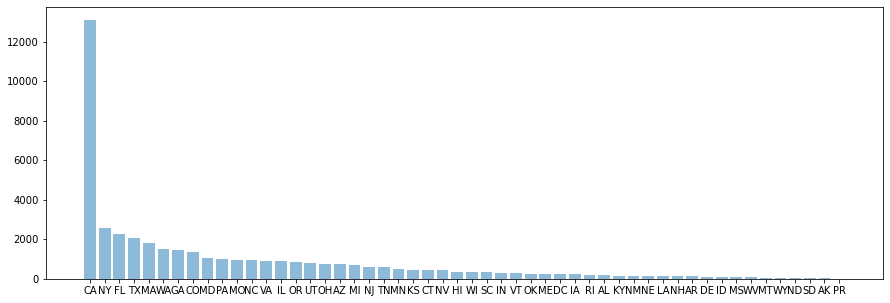

In [19]:
# Plotting the number of EV Charging stations by State
plt.figure(figsize=(15,5))
plt.bar(evcs_by_state['State'].values, evcs_by_state['station_count'].values, align='center', alpha=0.5)

We would like to create effective visualization for the same data. Using altair, we created most of the visualizations for EDA.

In [20]:
alt.themes.enable('fivethirtyeight')

#Creating Bar Chart with State Names and Station Count
bars = alt.Chart(evcs_by_state).mark_bar(color='#1e90ff').encode(
    x=alt.Y("State_Name:N", sort='-y', title='State',
           axis=alt.Axis(labelAngle=-45, domain=False, labelColor='black')),
    y=alt.Y("station_count:Q", title='Number of EV Charging Stations',
           axis=alt.Axis(domain=False, labelColor='black'))
)

#Adding number of stations as text
text = bars.mark_text(
    angle=315,
    align='center',
    baseline='top',
    dx= 10,
    dy=-10  
).encode(
    text='station_count:Q'
)

#Combining Bar Chart and Text
(bars + text).properties(
    height=500, width=1000, 
    title={'text': 'Electric Vehicle Charging Stations per State',
          }
    ).configure_view(strokeWidth=0)

alt.LayerChart(...)

Wow, California clearly leads the way for Electric vehicle infrastructure! 

Let's filter the dataset and see the top 10 states

In [21]:
alt.themes.enable('fivethirtyeight')

#Creating Bar Chart with State Names and Station Count for top 10 states
bars = alt.Chart(evcs_by_state[:10]).mark_bar(color='#1e90ff').encode(
    x=alt.Y("State_Name:N", sort='-y', title='State',
           axis=alt.Axis(labelAngle=-45, domain=False, labelColor='black')),
    y=alt.Y("station_count:Q", title='Number of EV Charging Stations',
           axis=alt.Axis(domain=False, labelColor='black'))
)

#Adding number of stations as text
text = bars.mark_text(
    align='center',
    baseline='middle',
    dx= 10,
    dy=-10,
    fontSize=20
).encode(
    text='station_count:Q'
)

#Combining Bar Chart and Text
(bars + text).properties(
    height=500, width=1000, 
    title={'text': 'Electric Vehicle Charging Stations - Top 10 States',
          }
    ).configure_axis(
    labelFontSize=20,
    titleFontSize=20
)

alt.LayerChart(...)

New York state is at second place which has just around 2500 charging station which drawn our interest to explore the EV infrastructure in NY state.

### EV Charging Stations in New York State

while EV registrations are growing at a near exponential rate in NY, the charging infrastructure does not adequately supply this demand. The ranges of EVs are increasing greatly, but the availability and speed of charging has not kept up.  

NY state has provided a $4,000 tax credit to businesses to install new chargers. Additionally, New York City (NYC) has begun installing curbside public stations to meet the demand. This motivated us to seek to identify gaps in this infrastructure and propose specific sites for development to fill these gaps. 

Time to deep dive into NY specific data and explore with visualization

In [22]:
#Dataframe for US EV Charge Stations
ny_evcs = us_evcs[us_evcs['State'] == 'NY']

In [23]:
ny_evcs.head()

,Fuel Type Code,Station Name,Street Address,Intersection Directions,City,State,ZIP,Plus4,Station Phone,Status Code,...,LPG Nozzle Types,Hydrogen Pressures,Hydrogen Standards,CNG Fill Type Code,CNG PSI,CNG Vehicle Class,LNG Vehicle Class,EV On-Site Renewable Source,Restricted Access,year_opened
616,ELEC,AAA Car Care Plus,2131 Eggert Rd,NaN,Amherst,NY,14226,NaN,716-362-0562,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2011
617,ELEC,AAA Car Care Plus,8120 Main St,NaN,Clarence,NY,14221,NaN,716-932-3900 855-443-3873,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018
677,ELEC,Thruway Nissan,79 Route 17K,NaN,Newburgh,NY,12550,NaN,845-562-1000,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2011
678,ELEC,Country Club Imports,55 Oneida St,NaN,Oneonta,NY,13820,NaN,607-432-2800,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2011
679,ELEC,West-Herr Nissan,3580 Southwestern Blvd,NaN,Orchard Park,NY,14127,NaN,716-662-8008,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2011


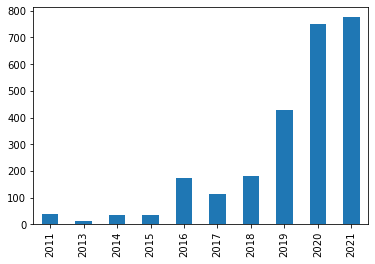

In [24]:
#Plotting simple barchart to see the Year over Year growth of the EV Charging Stations in NY State
ny_evcs['year_opened'].value_counts()[:10].sort_index().plot(kind='bar')

In [25]:
#Grouping the data by year and getting the count for each year
ny_yr_evcs = ny_evcs.groupby('year_opened').size().reset_index(name='year_count').sort_values(by='year_count', ascending=False).reset_index(drop=True)
ny_yr_evcs.head()

,year_opened,year_count
0,2021,776
1,2020,749
2,2019,430
3,2018,182
4,2016,175


In [26]:
# Dropping NULL year
ny_yr_evcs = ny_yr_evcs.drop(labels=9, axis=0)
ny_yr_evcs.head()

,year_opened,year_count
0,2021,776
1,2020,749
2,2019,430
3,2018,182
4,2016,175


In [27]:
#Creating Bar Chart with Year opened and Station Count
bars_yr = alt.Chart(ny_yr_evcs[:20]).mark_bar(color='#FFA500').encode(
    x=alt.Y("year_opened:N", sort='x', title='Year',
           axis=alt.Axis(labelAngle=-45, domain=False, labelColor='black')),
    y=alt.Y("year_count:Q", title='Number of EV Charging Stations Opened',
           axis=alt.Axis(domain=False, labelColor='black'))
)

#Adding number of stations as text
text = bars_yr.mark_text(
    angle=315,
    align='center',
    baseline='top',
    dx= 20,
    dy=-20,
    fontSize=25
).encode(
    text='year_count:Q'
)

#Combining Bar Chart and Text
(bars_yr + text).properties(
    height=500, width=1000, 
    title={'text': 'Electric Car Charging Stations opened per Year in NY State',
          }
    ).configure_axis(
    labelFontSize=20,
    titleFontSize=20
)

alt.LayerChart(...)

The number of EV charging stations in New York are increasing exponentially Year over year. NY is adding almost 500+ new charging stations every year.

In [28]:
#Getting the number of EV charging stations by Cities in NY state
ny_cities_evcs = ny_evcs.groupby('City').size().reset_index(name='station_count').sort_values(by='station_count', ascending=False).reset_index(drop=True)
ny_cities_evcs.head()

,City,station_count
0,New York,330
1,Buffalo,132
2,Albany,118
3,Rochester,115
4,Brooklyn,73


In [29]:
#Creating Bar Chart with cities in NY and Station Count
bars = alt.Chart(ny_cities_evcs[:5]).mark_bar(color='#FFA500').encode(
    x=alt.Y("City:N", sort='-y', title='City Name',
           axis=alt.Axis(labelAngle=-45, domain=False, labelColor='black')),
    y=alt.Y("station_count:Q", title='Number of EV Charging Stations',
           axis=alt.Axis(domain=False, labelColor='black'))
)

#Adding number of stations as text
text = bars.mark_text(
    angle=315,
    align='center',
    baseline='top',
    dx= 10,
    dy=-10,
    fontSize=25
).encode(
    text='station_count:Q'
)

#Combining Bar Chart and Text
(bars + text).properties(
    height=500, width=1000, 
    title={'text': 'Electric Car Charging Stations per Cities in NY',
          }
    ).configure_axis(
    labelFontSize=20,
    titleFontSize=20
)

alt.LayerChart(...)

New York city tops in number of charging stations with 330, Buffalo with 132, Albany with 118, Rochester with 115 and Brooklyn has 73 made it to top 5 cities with most number of EV Charging stations.


# **Geographical Visualization**

## US State Map - EV Charge Stations

We have used geopandas libraries to read the US Geographical Shape files.

**GeoPandas:**
GeoPandas is an open source project to make working with geospatial data in python easier. GeoPandas extends the datatypes used by pandas to allow spatial operations on geometric types. Geometric operations are performed by shapely. Geopandas further depends on fiona for file access and matplotlib for plotting.

More details on geopandas, please refer here - https://github.com/geopandas/geopandas


**US State Boundaries Shape File**

The cartographic boundary files are simplified representations of selected geographic areas from the Census Bureau’s MAF/TIGER geographic database. These boundary files are specifically designed for small scale thematic mapping.

The cartographic boundary files are available in shapefile and KML format.  A shapefile is a geospatial data format for use in geographic information system (GIS) software. For KML versions of these files, please see our Cartographic Boundary Files - KML page.

Downloaded from [census.gov](https://www.census.gov/geographies/mapping-files/time-series/geo/carto-boundary-file.html)

Metadata availale [here](https://www2.census.gov/geo/tiger/GENZ2018/2018_file_name_def.pdf?#)

In [30]:
#Reading the Shape File for US State Boundaries using geopandas
state_boundaries = geopandas.read_file('assets/US_State_Boundaries/cb_2018_us_state_20m.shp')

#The Coordinate Reference System (CRS) is important because the geometric shapes in a GeoSeries or GeoDataFrame object are 
# simply a collection of coordinates in an arbitrary space. 
#A CRS tells Python how those coordinates relate to places on the Earth.
# In our case, WGS84 Latitude/Longitude: "EPSG:4326" is used.
state_boundaries.crs = "EPSG:4326" 

In [31]:
state_boundaries.columns

Index(['STATEFP', 'STATENS', 'AFFGEOID', 'GEOID', 'STUSPS', 'NAME', 'LSAD',
       'ALAND', 'AWATER', 'geometry'],
      dtype='object')

In [32]:
#Creating State column using USPS State codes
state_boundaries['State'] = state_boundaries['STUSPS']

In [33]:
state_boundaries.head()

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry,State
0,24,01714934,0400000US24,24,MD,Maryland,00,25151100280,6979966958,"MULTIPOLYGON (((-76.04621 38.02553, -76.00734 ...",MD
1,19,01779785,0400000US19,19,IA,Iowa,00,144661267977,1084180812,"POLYGON ((-96.62187 42.77925, -96.57794 42.827...",IA
2,10,01779781,0400000US10,10,DE,Delaware,00,5045925646,1399985648,"POLYGON ((-75.77379 39.72220, -75.75323 39.757...",DE
3,39,01085497,0400000US39,39,OH,Ohio,00,105828882568,10268850702,"MULTIPOLYGON (((-82.86334 41.69369, -82.82572 ...",OH
4,42,01779798,0400000US42,42,PA,Pennsylvania,00,115884442321,3394589990,"POLYGON ((-80.51989 40.90666, -80.51964 40.987...",PA


In [34]:
# Merging the EV charging Station dataframe with State Boundaries dataframe to get the geo cocordinates from shape files.
evcs_state_boundaries = state_boundaries.merge(evcs_by_state, how='outer', on='State') 

evcs_state_boundaries.sort_values(by='station_count', ascending=True)
evcs_state_boundaries.head()

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry,State,station_count,State_Name
0,24,01714934,0400000US24,24,MD,Maryland,00,25151100280,6979966958,"MULTIPOLYGON (((-76.04621 38.02553, -76.00734 ...",MD,1045,Maryland
1,19,01779785,0400000US19,19,IA,Iowa,00,144661267977,1084180812,"POLYGON ((-96.62187 42.77925, -96.57794 42.827...",IA,219,Iowa
2,10,01779781,0400000US10,10,DE,Delaware,00,5045925646,1399985648,"POLYGON ((-75.77379 39.72220, -75.75323 39.757...",DE,104,Delaware
3,39,01085497,0400000US39,39,OH,Ohio,00,105828882568,10268850702,"MULTIPOLYGON (((-82.86334 41.69369, -82.82572 ...",OH,770,Ohio
4,42,01779798,0400000US42,42,PA,Pennsylvania,00,115884442321,3394589990,"POLYGON ((-80.51989 40.90666, -80.51964 40.987...",PA,996,Pennsylvania


In [35]:
#Cleaning up the dataframe
evcs_state_boundaries = evcs_state_boundaries[evcs_state_boundaries['geometry'].notna()]
evcs_state_boundaries = evcs_state_boundaries.fillna(0)

evcs_state_boundaries.head()

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry,State,station_count,State_Name
0,24,01714934,0400000US24,24,MD,Maryland,00,25151100280,6979966958,"MULTIPOLYGON (((-76.04621 38.02553, -76.00734 ...",MD,1045,Maryland
1,19,01779785,0400000US19,19,IA,Iowa,00,144661267977,1084180812,"POLYGON ((-96.62187 42.77925, -96.57794 42.827...",IA,219,Iowa
2,10,01779781,0400000US10,10,DE,Delaware,00,5045925646,1399985648,"POLYGON ((-75.77379 39.72220, -75.75323 39.757...",DE,104,Delaware
3,39,01085497,0400000US39,39,OH,Ohio,00,105828882568,10268850702,"MULTIPOLYGON (((-82.86334 41.69369, -82.82572 ...",OH,770,Ohio
4,42,01779798,0400000US42,42,PA,Pennsylvania,00,115884442321,3394589990,"POLYGON ((-80.51989 40.90666, -80.51964 40.987...",PA,996,Pennsylvania


In [36]:
evcs_state_boundaries.station_count.max()

13094

**Folium Mapping**

Folium is a powerful Python library that helps you create several types of Leaflet maps. The fact that the Folium results are interactive makes this library very useful for dashboard building. 

In [37]:
# Creating a map using folium 
m1 = folium.Map([39.8283, -98.5795], zoom_start=4)

folium.TileLayer(tiles='CartoDB positron',control=True, opacity=0.0).add_to(m1)

folium.Choropleth(
    geo_data=evcs_state_boundaries,
    name="choropleth",
    data=evcs_state_boundaries,
    columns=["State", "station_count"],
    key_on="feature.properties.State",
    fill_color="OrRd",
    fill_opacity=0.6,
    line_opacity=0.2,
    legend_name="Number of EV Charging Stations in US",
).add_to(m1)

In [38]:
#Display the map
m1

Cool, as we already seen in the previous bar charts, California, New York and Florida stand out with more number of EV Charging Stations

**US Zip Code Dataset**

EV Charging Stations dataset only contains ZIP code and we need to add County Name to analyze the data by Counties. We will use the Zip Code database file to join the Charging stations dataset to map the zipcode to County Name

We have downloaded the Zip Code - County Mapping from [here](https://www.unitedstateszipcodes.org/zip-code-database/)

In [39]:
#Loading the EV Charging Station CSV file into dataframe
zip_county = pd.read_csv('assets/ZIP_database/zip_code_database.csv')

#Keeping only the columns needed
zip_county = zip_county[['zip','county','state']]
zip_county = zip_county.set_index('zip')

#Let's create zip-county dictionary from zipcode datadrame
zip_county_dict = zip_county.to_dict('index')

In [40]:
zip_county.head()

,county,state
zip,,
501,Suffolk County,NY
544,Suffolk County,NY
601,Adjuntas Municipio,PR
602,Aguada Municipio,PR
603,Aguadilla Municipio,PR


In [41]:
evcs_by_zip = evcs_all.copy()
evcs_by_zip.columns

Index(['Fuel Type Code', 'Station Name', 'Street Address',
       'Intersection Directions', 'City', 'State', 'ZIP', 'Plus4',
       'Station Phone', 'Status Code', 'Expected Date',
       'Groups With Access Code', 'Access Days Time', 'Cards Accepted',
       'BD Blends', 'NG Fill Type Code', 'NG PSI', 'EV Level1 EVSE Num',
       'EV Level2 EVSE Num', 'EV DC Fast Count', 'EV Other Info', 'EV Network',
       'EV Network Web', 'Geocode Status', 'Latitude', 'Longitude',
       'Date Last Confirmed', 'ID', 'Updated At', 'Owner Type Code',
       'Federal Agency ID', 'Federal Agency Name', 'Open Date',
       'Hydrogen Status Link', 'NG Vehicle Class', 'LPG Primary',
       'E85 Blender Pump', 'EV Connector Types', 'Country',
       'Intersection Directions (French)', 'Access Days Time (French)',
       'BD Blends (French)', 'Groups With Access Code (French)',
       'Hydrogen Is Retail', 'Access Code', 'Access Detail Code',
       'Federal Agency Code', 'Facility Type', 'CNG Dispenser N

In [42]:
#Keeping only the columns needed
evcs_by_zip = evcs_by_zip[['City','State','ZIP','Access Code','Access Days Time', 'Latitude',
                                'Longitude','EV Level1 EVSE Num','EV Level2 EVSE Num', 'EV DC Fast Count']]
evcs_by_zip.head()

,City,State,ZIP,Access Code,Access Days Time,Latitude,Longitude,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count
0,Los Angeles,CA,90015,public,24 hours daily; pay lot,34.040539,-118.271387,NaN,12.0,NaN
1,El Monte,CA,91731,public,24 hours daily,34.068720,-118.064000,NaN,3.0,NaN
2,La Jolla,CA,92037,public,24 hours daily,32.899470,-117.243000,NaN,1.0,NaN
3,Escondido,CA,92027,public,24 hours daily,33.098589,-117.004433,NaN,2.0,NaN
4,Sepulveda,CA,91343,public,Dealership business hours,34.221665,-118.468371,NaN,2.0,NaN


In [43]:
#Data Manipulation

#Convert zip codes from objects to numbers
evcs_by_zip.ZIP =evcs_by_zip.ZIP.apply(pd.to_numeric, errors='coerce') 

#Use zip_dict to map to counties
evcs_by_zip['County1'] = evcs_by_zip['ZIP'].map(zip_county_dict) 

In [44]:
evcs_by_zip.head()

,City,State,ZIP,Access Code,Access Days Time,Latitude,Longitude,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count,County1
0,Los Angeles,CA,90015.0,public,24 hours daily; pay lot,34.040539,-118.271387,NaN,12.0,NaN,"{'county': 'Los Angeles County', 'state': 'CA'}"
1,El Monte,CA,91731.0,public,24 hours daily,34.068720,-118.064000,NaN,3.0,NaN,"{'county': 'Los Angeles County', 'state': 'CA'}"
2,La Jolla,CA,92037.0,public,24 hours daily,32.899470,-117.243000,NaN,1.0,NaN,"{'county': 'San Diego County', 'state': 'CA'}"
3,Escondido,CA,92027.0,public,24 hours daily,33.098589,-117.004433,NaN,2.0,NaN,"{'county': 'San Diego County', 'state': 'CA'}"
4,Sepulveda,CA,91343.0,public,Dealership business hours,34.221665,-118.468371,NaN,2.0,NaN,"{'county': 'Los Angeles County', 'state': 'CA'}"


In [45]:
#Create dataframe with counties separated
temp_df = evcs_by_zip['County1'].apply(pd.Series)

In [46]:
temp_df.head()

,0,county,state
0,NaN,Los Angeles County,CA
1,NaN,Los Angeles County,CA
2,NaN,San Diego County,CA
3,NaN,San Diego County,CA
4,NaN,Los Angeles County,CA


In [47]:
# Concatenating EV Charging Station and temporary dataframes to add county name
evcs_by_zip = pd.concat([evcs_by_zip, temp_df['county']], axis=1) 
evcs_by_zip.head()

,City,State,ZIP,Access Code,Access Days Time,Latitude,Longitude,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count,County1,county
0,Los Angeles,CA,90015.0,public,24 hours daily; pay lot,34.040539,-118.271387,NaN,12.0,NaN,"{'county': 'Los Angeles County', 'state': 'CA'}",Los Angeles County
1,El Monte,CA,91731.0,public,24 hours daily,34.068720,-118.064000,NaN,3.0,NaN,"{'county': 'Los Angeles County', 'state': 'CA'}",Los Angeles County
2,La Jolla,CA,92037.0,public,24 hours daily,32.899470,-117.243000,NaN,1.0,NaN,"{'county': 'San Diego County', 'state': 'CA'}",San Diego County
3,Escondido,CA,92027.0,public,24 hours daily,33.098589,-117.004433,NaN,2.0,NaN,"{'county': 'San Diego County', 'state': 'CA'}",San Diego County
4,Sepulveda,CA,91343.0,public,Dealership business hours,34.221665,-118.468371,NaN,2.0,NaN,"{'county': 'Los Angeles County', 'state': 'CA'}",Los Angeles County


In [48]:
#Adding a new column to combine county and state
evcs_by_zip['county_state'] = evcs_by_zip['county'] + ',' + evcs_by_zip['State']

In [49]:
evcs_by_zip.head()

,City,State,ZIP,Access Code,Access Days Time,Latitude,Longitude,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count,County1,county,county_state
0,Los Angeles,CA,90015.0,public,24 hours daily; pay lot,34.040539,-118.271387,NaN,12.0,NaN,"{'county': 'Los Angeles County', 'state': 'CA'}",Los Angeles County,"Los Angeles County,CA"
1,El Monte,CA,91731.0,public,24 hours daily,34.068720,-118.064000,NaN,3.0,NaN,"{'county': 'Los Angeles County', 'state': 'CA'}",Los Angeles County,"Los Angeles County,CA"
2,La Jolla,CA,92037.0,public,24 hours daily,32.899470,-117.243000,NaN,1.0,NaN,"{'county': 'San Diego County', 'state': 'CA'}",San Diego County,"San Diego County,CA"
3,Escondido,CA,92027.0,public,24 hours daily,33.098589,-117.004433,NaN,2.0,NaN,"{'county': 'San Diego County', 'state': 'CA'}",San Diego County,"San Diego County,CA"
4,Sepulveda,CA,91343.0,public,Dealership business hours,34.221665,-118.468371,NaN,2.0,NaN,"{'county': 'Los Angeles County', 'state': 'CA'}",Los Angeles County,"Los Angeles County,CA"


In [50]:
#Grouping by County State
evcs_by_county = evcs_by_zip.groupby('county_state').agg({'City': 'size', 'EV Level1 EVSE Num': 'count',\
                                                                'EV Level2 EVSE Num':'count','EV DC Fast Count':'count'}).\
                                                                    reset_index().sort_values(by='City', ascending=False).reset_index(drop=True)


evcs_by_county.columns = ['county_state','counts','EV Level1 EVSE Num','EV Level2 EVSE Num', 'EV DC Fast Count']

evcs_by_county.head()

,county_state,counts,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count
0,"Los Angeles County,CA",3157,8,2971,236
1,"Santa Clara County,CA",1557,1,1482,99
2,"Orange County,CA",1425,8,1305,150
3,"San Mateo County,CA",1016,0,941,87
4,"San Diego County,CA",913,2,862,79


In [51]:
#Plotting EV Level 1 Charging Ports

bars = alt.Chart(evcs_by_county[:20]).mark_bar(color='#1e90ff').encode(
    x=alt.Y("county_state:N", sort='-y', title='County and State',
           axis=alt.Axis(labelAngle=-45, domain=False, labelColor='black')),
    y=alt.Y("EV Level1 EVSE Num:Q", title='Number of L1 EV Charging Stations',
           axis=alt.Axis(domain=False, labelColor='black'))
)

text = bars.mark_text(
    angle=315,
    align='center',
    baseline='top',
    dx= 10,
    dy=-10  
).encode(
    text='EV Level1 EVSE Num:Q'
)

(bars + text).properties(
    height=500, width=1000, 
    title={'text': 'L1 Electric Car Charging Stations in Top 20 Counties acrosss US',
          }
    ).configure_view(strokeWidth=0)

alt.LayerChart(...)

## US State& County Map - EV Charge Stations

**County Boundary**

Similar to the  State boundaries shape file, census Bureau provides the boundary maps for US counties as well.

The shape file for US county boundaries downloaded fronm [US Census Bureau](https://www.census.gov/geographies/mapping-files/time-series/geo/cartographic-boundary.html)

In [52]:
#Reading the Shape File for US State Boundaries using geopandas
county_boundaries = geopandas.read_file('assets/County_Boundaries/cb_2019_us_county_20m.shp')

#The Coordinate Reference System (CRS) is important because the geometric shapes in a GeoSeries or GeoDataFrame object are 
# simply a collection of coordinates in an arbitrary space. 
#A CRS tells Python how those coordinates relate to places on the Earth.
# In our case, WGS84 Latitude/Longitude: "EPSG:4326" is used.
county_boundaries.crs = "EPSG:4326" 

In [53]:
#Data Manipulation

#Keeping only the key data elelments needed.
county_boundaries_1 = county_boundaries[['geometry','STATEFP','COUNTYFP','NAME']]
#Setting CRS to 4326
county_boundaries_1.crs = "EPSG:4326" 

#Concatenate STATEFP and COUNTYFP, this will provide the full name for State and County
county_boundaries_1['STCOUNTYFP'] = county_boundaries_1['STATEFP'] + county_boundaries_1['COUNTYFP']

#Changing the data type to integer
county_boundaries_1['STCOUNTYFP'] = county_boundaries_1['STCOUNTYFP'].astype(int)

**ZIP Code & County Mapping - Geographical dataset**

The County Cross Reference File is a product which provides a relationship between ZIP+4 codes and Federal Information Processing Standard (FIPS) county codes.  The file allows users who have assigned ZIP+4 codes to their address files to obtain county data at the ZIP+4 level.

This dataset is available in various place but found the latest in [Kaggle](https://www.kaggle.com/danofer/zipcodes-county-fips-crosswalk)

In [54]:
#Reading the CSV file and loading into dataframe
zip_fips= pd.read_csv('assets/ZIP_County_FIPS/ZIP-COUNTY-FIPS_2017-06.csv')

In [55]:
zip_fips.columns

Index(['ZIP', 'COUNTYNAME', 'STATE', 'STCOUNTYFP', 'CLASSFP'], dtype='object')

In [56]:
#Data Manipulation

#Removing Duplicate reows
zip_fips = zip_fips.drop_duplicates(subset=['STCOUNTYFP'],keep='first')

#Keeping only columns that are needed
zip_fips = zip_fips[['COUNTYNAME','STATE','STCOUNTYFP']]

Now, we have US County dataset and County ZIP mapped dataset. Time to merge the dataframes to have all required columns in one place.

In [59]:
#Merging County Boundaries data with ZIP_FIPS dataset using STCOUNTYFP column
county_fips = county_boundaries_1.merge(zip_fips, how='outer', on='STCOUNTYFP')

#Creating a new column to concatenate County with State for better display
county_fips['county_state'] = county_fips['COUNTYNAME'] + ',' + county_fips['STATE'] 

county_fips.head()

,geometry,STATEFP,COUNTYFP,NAME,STCOUNTYFP,COUNTYNAME,STATE,county_state
0,"POLYGON ((-94.63203 40.57176, -94.53388 40.570...",29,227,Worth,29227,Worth County,MO,"Worth County,MO"
1,"POLYGON ((-99.17940 40.35068, -98.72683 40.350...",31,061,Franklin,31061,Franklin County,NE,"Franklin County,NE"
2,"POLYGON ((-79.76195 42.26986, -79.62748 42.324...",36,013,Chautauqua,36013,Chautauqua County,NY,"Chautauqua County,NY"
3,"POLYGON ((-78.49773 36.51467, -78.45728 36.541...",37,181,Vance,37181,Vance County,NC,"Vance County,NC"
4,"POLYGON ((-88.94916 36.41010, -88.81642 36.410...",47,183,Weakley,47183,Weakley County,TN,"Weakley County,TN"


Now, we have County boundaries and County State name in one place, lets merge this into EV Charging stations by County dataframe to visualize in Folium map.

In [60]:
evcs_by_county.head()

,county_state,counts,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count
0,"Los Angeles County,CA",3157,8,2971,236
1,"Santa Clara County,CA",1557,1,1482,99
2,"Orange County,CA",1425,8,1305,150
3,"San Mateo County,CA",1016,0,941,87
4,"San Diego County,CA",913,2,862,79


In [61]:
# Merging the County boundaries dataset with EV Charging stations by County dataset
evcs_county_state = county_fips.merge(evcs_by_county, how='outer', on='county_state')
evcs_county_state.head()

,geometry,STATEFP,COUNTYFP,NAME,STCOUNTYFP,COUNTYNAME,STATE,county_state,counts,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count
0,"POLYGON ((-94.63203 40.57176, -94.53388 40.570...",29,227,Worth,29227.0,Worth County,MO,"Worth County,MO",NaN,NaN,NaN,NaN
1,"POLYGON ((-99.17940 40.35068, -98.72683 40.350...",31,061,Franklin,31061.0,Franklin County,NE,"Franklin County,NE",NaN,NaN,NaN,NaN
2,"POLYGON ((-79.76195 42.26986, -79.62748 42.324...",36,013,Chautauqua,36013.0,Chautauqua County,NY,"Chautauqua County,NY",14.0,0.0,12.0,2.0
3,"POLYGON ((-78.49773 36.51467, -78.45728 36.541...",37,181,Vance,37181.0,Vance County,NC,"Vance County,NC",4.0,0.0,2.0,2.0
4,"POLYGON ((-88.94916 36.41010, -88.81642 36.410...",47,183,Weakley,47183.0,Weakley County,TN,"Weakley County,TN",1.0,0.0,1.0,0.0


In [62]:
#Sorting the dataframe by counts column
evcs_county_state.sort_values(by='counts', ascending=True)

#Cleaning up records, removing records with no geographical values
evcs_county_state = evcs_county_state[evcs_county_state['geometry'].notna()]

#Replacing null values with 0
evcs_county_state = evcs_county_state.fillna(0)

evcs_county_state.head()

,geometry,STATEFP,COUNTYFP,NAME,STCOUNTYFP,COUNTYNAME,STATE,county_state,counts,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count
0,"POLYGON ((-94.63203 40.57176, -94.53388 40.570...",29,227,Worth,29227.0,Worth County,MO,"Worth County,MO",0.0,0.0,0.0,0.0
1,"POLYGON ((-99.17940 40.35068, -98.72683 40.350...",31,061,Franklin,31061.0,Franklin County,NE,"Franklin County,NE",0.0,0.0,0.0,0.0
2,"POLYGON ((-79.76195 42.26986, -79.62748 42.324...",36,013,Chautauqua,36013.0,Chautauqua County,NY,"Chautauqua County,NY",14.0,0.0,12.0,2.0
3,"POLYGON ((-78.49773 36.51467, -78.45728 36.541...",37,181,Vance,37181.0,Vance County,NC,"Vance County,NC",4.0,0.0,2.0,2.0
4,"POLYGON ((-88.94916 36.41010, -88.81642 36.410...",47,183,Weakley,47183.0,Weakley County,TN,"Weakley County,TN",1.0,0.0,1.0,0.0


In [63]:
evcs_county_state.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 3220 entries, 0 to 3219
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   geometry            3220 non-null   geometry
 1   STATEFP             3220 non-null   object  
 2   COUNTYFP            3220 non-null   object  
 3   NAME                3220 non-null   object  
 4   STCOUNTYFP          3220 non-null   float64 
 5   COUNTYNAME          3220 non-null   object  
 6   STATE               3220 non-null   object  
 7   county_state        3220 non-null   object  
 8   counts              3220 non-null   float64 
 9   EV Level1 EVSE Num  3220 non-null   float64 
 10  EV Level2 EVSE Num  3220 non-null   float64 
 11  EV DC Fast Count    3220 non-null   float64 
dtypes: float64(5), geometry(1), object(6)
memory usage: 327.0+ KB


In [64]:
len(evcs_county_state)

3220

We have used branca elements to have CSS style Legend for the Folium choropleth.

For more details on branca - please refere here - https://python-visualization.github.io/branca/element.html#element

In [65]:
# Code for creating Legend for the map

from branca.element import Template, MacroElement

legend = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; left: 20px; bottom: 20px;'>
     
<div class='legend-title'>EV Charging</div>
<div class='legend-title'>Stations</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:#EC6D10;opacity:0.8;'></span>0</li>
    <li><span style='background:#EF7C24;opacity:0.8;'></span>1 - 2</li>
    <li><span style='background:#E73927;opacity:0.8;'></span>3 - 11</li>
    <li><span style='background:#DD1F13;opacity:0.8;'></span>12 - 65</li>
    <li><span style='background:#CF0107;opacity:0.8;'></span>66 - 2699</li>

  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

In [66]:
import folium

us_map = folium.Map([39.8283, -98.5795], zoom_start=4)

#Mapbox Bright
folium.TileLayer('CartoDB positron',name='Positron').add_to(us_map)
    
myscale = [0, 1, 3, 12, 66, evcs_county_state.counts.max()]

colors = ['#d1eca0', '#9ed688', '#62bb6e', '#329750', '#0e723b']

choropleth = folium.Choropleth(
    geo_data=evcs_county_state,
    data=evcs_county_state,
    columns=["county_state", "counts"],
    key_on="feature.properties.county_state",
    fill_color = 'OrRd',
    threshold_scale=myscale,
    fill_opacity =  1,
    line_color='white',
    line_weight = .2,
    line_opacity=.6,
    name="Charging Stations",
    show=True,
    legend_name = 'Charging Stations in County',
    highlight = True,
    smooth_factor = .2
).add_to(us_map)

#Using Macro and Legend templates
macro = MacroElement()
macro._template = Template(legend)

us_map.get_root().add_child(macro)

folium.LayerControl(collapsed=True).add_to(us_map)

choropleth.geojson.add_child(folium.features.GeoJsonTooltip(
        fields=['COUNTYNAME', 'STATE', 'counts', 'EV Level1 EVSE Num', 'EV Level2 EVSE Num', 'EV DC Fast Count'],
        aliases=['County:     ', 'State:     ', 'Charging Stations:     ',\
                'Number of Stations w/ Lvl. 1 Charging:     ',
                'Number of Stations w/ Lvl. 2 Charging:     ',\
                'Number of Stations w/ DC Fast Charging:     '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        localize=True
        )
)

for key in choropleth._children:
    if key.startswith('color_map'):
        del(choropleth._children[key])
        
us_map.save(outfile= "EV_Charging_Stations_US.html")

from IPython.display import IFrame

IFrame(src='EV_Charging_Stations_US.html', width=850, height=450)

Based on the color distribution, the states/counties with darker color has relatively more EV Charging stations. California tops in the list as there are more number of EV vehicles on the road and the EV Charging Infrastructure is more complete. New York state is at second place which has just around 2500 charging station which drawn our interest to explore the EV infrastructure in NY state.

California's push to decarbonize transportation made the state to top in the list, similar actions are proposed in other states, especially in New York. Our scope for this project is to analyze the EV charging infrastructure in New York state and identify the possible gaps based on the EV vehicles on the road. 

# EV Charging Infrastructure in New York

Time to explore the dataset specific to New York and understand the current EV Charging infrastructure.

We have used same datasets, EV Charging Stations, County Boundaries, Zip code and Count mapping. But, this time the dataframes are filtered to use only NY state specific data.

In [67]:
#Dataframe for US EV Charge Stations
ny_evcs = us_evcs[us_evcs['State'] == 'NY']

In [68]:
ny_evcs.head()

,Fuel Type Code,Station Name,Street Address,Intersection Directions,City,State,ZIP,Plus4,Station Phone,Status Code,...,LPG Nozzle Types,Hydrogen Pressures,Hydrogen Standards,CNG Fill Type Code,CNG PSI,CNG Vehicle Class,LNG Vehicle Class,EV On-Site Renewable Source,Restricted Access,year_opened
616,ELEC,AAA Car Care Plus,2131 Eggert Rd,NaN,Amherst,NY,14226,NaN,716-362-0562,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2011
617,ELEC,AAA Car Care Plus,8120 Main St,NaN,Clarence,NY,14221,NaN,716-932-3900 855-443-3873,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018
677,ELEC,Thruway Nissan,79 Route 17K,NaN,Newburgh,NY,12550,NaN,845-562-1000,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2011
678,ELEC,Country Club Imports,55 Oneida St,NaN,Oneonta,NY,13820,NaN,607-432-2800,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2011
679,ELEC,West-Herr Nissan,3580 Southwestern Blvd,NaN,Orchard Park,NY,14127,NaN,716-662-8008,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2011


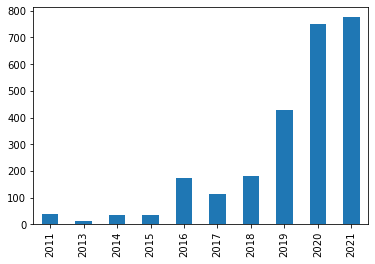

In [69]:
#Plotting Basic charts
ny_evcs['year_opened'].value_counts()[:10].sort_index().plot(kind='bar')

In [70]:
# Creating a dataframe grouping by year opened and count the charging stations per year.
ny_yr_evcs = ny_evcs.groupby('year_opened').size().reset_index(name='year_count').sort_values(by='year_count', ascending=False).reset_index(drop=True)
ny_yr_evcs.head()

,year_opened,year_count
0,2021,776
1,2020,749
2,2019,430
3,2018,182
4,2016,175


In [71]:
# Removing NULL year records
ny_yr_evcs = ny_yr_evcs.drop(labels=9, axis=0)

**EV Charging stations count by Year**

In [72]:
#Plotting the same dataset but using altair now...

bars_yr = alt.Chart(ny_yr_evcs[:20]).mark_bar(color='#FFA500').encode(
    x=alt.Y("year_opened:N", sort='x', title='Year',
           axis=alt.Axis(labelAngle=-45, domain=False, labelColor='black')),
    y=alt.Y("year_count:Q", title='Number of EV Charging Stations Opened',
           axis=alt.Axis(domain=False, labelColor='black'))
)

text = bars_yr.mark_text(
    angle=315,
    align='center',
    baseline='top',
    dx= 20,
    dy=-20,
    fontSize=25
).encode(
    text='year_count:Q'
)

(bars_yr + text).properties(
    height=500, width=1000, 
    title={'text': 'Electric Vehicle Charging Stations opened per Year in NY State',
          }
    ).configure_axis(
    labelFontSize=20,
    titleFontSize=20
)

alt.LayerChart(...)

The number of EV charging stations in New York are increasing exponentially Year over year. NY is adding almost 500+ new charging stations every year.

**EV Charging Station in top 5 cities in NY state**

In [73]:
# Grouping the data by City 
ny_cities_evcs = ny_evcs.groupby('City').size().reset_index(name='station_count').sort_values(by='station_count', ascending=False).reset_index(drop=True)
ny_cities_evcs.head()

,City,station_count
0,New York,330
1,Buffalo,132
2,Albany,118
3,Rochester,115
4,Brooklyn,73


In [74]:
bars = alt.Chart(ny_cities_evcs[:5]).mark_bar(color='#FFA500').encode(
    x=alt.Y("City:N", sort='-y', title='City Name',
           axis=alt.Axis(labelAngle=-45, domain=False, labelColor='black')),
    y=alt.Y("station_count:Q", title='Number of EV Charging Stations',
           axis=alt.Axis(domain=False, labelColor='black'))
)

text = bars.mark_text(
    angle=315,
    align='center',
    baseline='top',
    dx= 10,
    dy=-10  
).encode(
    text='station_count:Q'
)

(bars + text).properties(
    height=500, width=1000, 
    title={'text': 'Electric Car Charging Stations per Cities in NY',
          }
    ).configure_axis(
    labelFontSize=20,
    titleFontSize=20
)

alt.LayerChart(...)

New York city tops in number of charging stations with 330, Buffalo with 132, Albany with 118, Rochester with 115 and Brooklyn has 73 made it to top 5 cities with most number of EV Charging stations.


## New York County Map for EV Charging Stations

In [75]:
#Filtering the dataset just for NY state
evcs_county_ny = evcs_county_state[evcs_county_state['STATE'].str.contains('NY')]

In [76]:
evcs_county_ny.head()

,geometry,STATEFP,COUNTYFP,NAME,STCOUNTYFP,COUNTYNAME,STATE,county_state,counts,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count
2,"POLYGON ((-79.76195 42.26986, -79.62748 42.324...",36,013,Chautauqua,36013.0,Chautauqua County,NY,"Chautauqua County,NY",14.0,0.0,12.0,2.0
53,"POLYGON ((-78.46550 43.12862, -77.99729 43.132...",36,037,Genesee,36037.0,Genesee County,NY,"Genesee County,NY",10.0,0.0,9.0,1.0
69,"POLYGON ((-73.60672 43.56714, -73.49291 43.657...",36,115,Washington,36115.0,Washington County,NY,"Washington County,NY",3.0,0.0,3.0,0.0
80,"POLYGON ((-76.98133 42.86121, -76.96393 43.013...",36,099,Seneca,36099.0,Seneca County,NY,"Seneca County,NY",5.0,0.0,3.0,2.0
101,"POLYGON ((-79.06078 42.53785, -78.99170 42.529...",36,009,Cattaraugus,36009.0,Cattaraugus County,NY,"Cattaraugus County,NY",8.0,0.0,7.0,1.0


In [77]:
import folium

m = folium.Map([42.3, -74],control_scale=True,zoom_start=6)

#Mapbox Bright
folium.TileLayer('CartoDB positron',name='Positron').add_to(m)
    
myscale = [0, 1, 3, 12, 66, evcs_county_ny.counts.max()]

colors = ['#EC6D10', '#EF7C24', '#EF7C24', '#DD1F13', '#CF0107']

choropleth = folium.Choropleth(
    geo_data=evcs_county_ny,
    data=evcs_county_ny,
    columns=["county_state", "counts"],
    key_on="feature.properties.county_state",
    fill_color = 'OrRd',
    threshold_scale=myscale,
    fill_opacity =  1,
    line_color='white',
    line_weight = .2,
    line_opacity=.6,
    name="Charging Stations",
    show=True,
    legend_name = 'Charging Stations in County',
    highlight = True,
    smooth_factor = .2
).add_to(m)

macro = MacroElement()
macro._template = Template(legend)

m.get_root().add_child(macro)

folium.LayerControl(collapsed=True).add_to(m)

choropleth.geojson.add_child(folium.features.GeoJsonTooltip(
        fields=['COUNTYNAME', 'STATE', 'counts', 'EV Level1 EVSE Num', 'EV Level2 EVSE Num', 'EV DC Fast Count'],
        aliases=['County:     ', 'State:     ', 'Charging Stations:     ',\
                'Number of Stations w/ Lvl. 1 Charging:     ',
                'Number of Stations w/ Lvl. 2 Charging:     ',\
                'Number of Stations w/ DC Fast Charging:     '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        localize=True
        )
)

#Delete Default color scale (It overlaps)
for key in choropleth._children:
    if key.startswith('color_map'):
        del(choropleth._children[key])
        
#Display the map and save
m.save(outfile= "ny_chargingstations_county.html")

from IPython.display import IFrame

IFrame(src='ny_chargingstations_county.html', width=850, height=450)

## EV Charging Network Map

There are various stakeholders in the EV Charging infrastructure such as Vehicle OEMs, Standa alone charging companies and Government. Now, let take look into the different EV Charging network available in NY State.

In [78]:
#Creating a dataframe with EV Charging network specific columns
ny_evcs_nw = ny_evcs[['Latitude','Longitude','EV Network','EV Level1 EVSE Num','EV Level2 EVSE Num', 'EV DC Fast Count','Station Name','Street Address','City',
                      'State','ZIP','Open Date','Groups With Access Code']]

#Creating a list of Lat and Long values
ny_evcs_nw['LatLong'] = list(zip(ny_evcs_nw["Latitude"], ny_evcs_nw["Longitude"]))

In [79]:
#Data Cleaning and Manipulation

#Filling Nan values with 0
ny_evcs_nw.fillna({'EV Level1 EVSE Num':0, 'EV Level2 EVSE Num':0, 'EV DC Fast Count':0}, inplace=True)

#Creating new column with Total Port counts available in every charging station
ny_evcs_nw['Port Count'] = ny_evcs_nw['EV Level1 EVSE Num']+ny_evcs_nw['EV Level2 EVSE Num']+ny_evcs_nw['EV DC Fast Count']

ny_evcs_nw.head()

,Latitude,Longitude,EV Network,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count,Station Name,Street Address,City,State,ZIP,Open Date,Groups With Access Code,LatLong,Port Count
616,42.979363,-78.821443,Non-Networked,0.0,1.0,0.0,AAA Car Care Plus,2131 Eggert Rd,Amherst,NY,14226,2011-12-31,Public,"(42.979363, -78.821443)",1.0
617,42.965851,-78.692780,Non-Networked,0.0,1.0,0.0,AAA Car Care Plus,8120 Main St,Clarence,NY,14221,2018-12-17,Public,"(42.965851, -78.69278)",1.0
677,41.504105,-74.068916,Non-Networked,0.0,1.0,0.0,Thruway Nissan,79 Route 17K,Newburgh,NY,12550,2011-11-30,Public - Call ahead,"(41.504105, -74.068916)",1.0
678,42.451285,-75.100333,Non-Networked,0.0,2.0,2.0,Country Club Imports,55 Oneida St,Oneonta,NY,13820,2011-11-30,Public - Call ahead,"(42.451285, -75.100333)",4.0
679,42.784867,-78.765580,Non-Networked,0.0,1.0,0.0,West-Herr Nissan,3580 Southwestern Blvd,Orchard Park,NY,14127,2011-11-30,Public - Call ahead,"(42.784867, -78.76558)",1.0


In [80]:
#Converting the datatype to integer
ny_evcs_nw['Port Count'] = ny_evcs_nw['Port Count'].astype(int)

In [81]:
#Let's take a look at unique EV networks available in NY
ny_evcs_nw['EV Network'].unique()

array(['Non-Networked', 'ChargePoint Network', 'EV Connect',
       'Blink Network', 'Tesla', 'Tesla Destination', 'Greenlots',
       'OpConnect', 'Electrify America', 'SemaCharge Network', 'Volta',
       'FLO', 'AMPUP', 'LIVINGSTON', 'eVgo Network'], dtype=object)

In [82]:
ny_evnw_cnt = ny_evcs_nw.groupby('EV Network').size().reset_index(name='Station Count').sort_values(by='Station Count', ascending=False).reset_index(drop=True)
ny_evnw_cnt

,EV Network,Station Count
0,ChargePoint Network,1422
1,Tesla Destination,480
2,EV Connect,262
3,Non-Networked,161
4,Blink Network,78
5,Tesla,52
6,LIVINGSTON,29
7,eVgo Network,23
8,SemaCharge Network,16
9,Electrify America,15


In [83]:
#Creating Folium map with EV Charging Network in NY

nw_map = folium.Map(width=1000, height=700,location=[42.3, -74], tiles = 'OpenStreetMap', zoom_start=7)

# add markers to map
for lat, lng in zip(ny_evcs_nw['Latitude'], ny_evcs_nw['Longitude']):
    try:
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            #popup=label,
            color='blue',
            fill=True,
            fill_color='#e3942d',
            fill_opacity=0.7).add_to(nw_map) 
    except:
        print(lat)
    
nw_map

So, as we identified earlier, New York city tops in number of charging stations. Buffalo, Albany, Rochester and  Brooklyn areas are having more number of charging stations.

We can also add more details to the map interms of number of stations, port counts, etc.,

In [84]:
# Folium Map with EV Charging Network

# Creating a legend

legend_html = '''
        <div style="position: fixed; bottom: 75px; right: 10px; width: 250px; height: 350px; 
                    background-color: light grey; border:1px grey; z-index:9999; font-size:14px"
                    >&nbsp; <b>EV Network</b> <br>
                        <i class="fa fa-circle" style="font-size:25px;color:#5C2D91"></i>
                    &nbsp; ChargePoint Network &nbsp&nbsp&nbsp; <br>
                        <i class="fa fa-circle" style="font-size:25px;color:#E81123"></i>
                    &nbsp; Tesla &nbsp; <br>
                        <i class="fa fa-circle" style="font-size:25px;color:#2683C6"></i>
                    &nbsp; Tesla Destination &nbsp; <br>
                        <i class="fa fa-circle" style="font-size:25px;color:#FF8C00"></i>
                    &nbsp; EV Connect <br>
                        <i class="fa fa-circle" style="font-size:25px;color:#107C10"></i>
                    &nbsp; Blink Network <br>
                        <i class="fa fa-circle" style="font-size:25px;color:#004B1C"></i>
                    &nbsp; Greenlots <br>
                        <i class="fa fa-circle" style="font-size:25px;color:#F4D25A"></i>
                    &nbsp; OpConnect <br>
                        <i class="fa fa-circle" style="font-size:25px;color:#4AC5BB"></i>
                    &nbsp; Electrify America <br>
                        <i class="fa fa-circle" style="font-size:25px;color:#3599B8"></i>
                    &nbsp; SemaCharge Network <br>
                        <i class="fa fa-circle" style="font-size:25px;color:#DFBFBF"></i>
                    &nbsp; Volta <br>
                        <i class="fa fa-circle" style="font-size:25px;color:#FB8281"></i>
                    &nbsp; FLO <br>
                        <i class="fa fa-circle" style="font-size:25px;color:#7F898A"></i>
                    &nbsp; AMPUP <br>
                        <i class="fa fa-circle" style="font-size:25px;color:#5F6B6D"></i>
                    &nbsp; LINVINGSTON <br>
                        <i class="fa fa-circle" style="font-size:25px;color:#E3008C"></i>
                    &nbsp; eVgo Network <br>
                        <i class="fa fa-circle" style="font-size:25px;color:#FFD700"></i>
                    &nbsp; Non-Networked 
        </div>
        ''' 


def color(nw):
    # Color range
    if (nw == 'ChargePoint Network'):   
            color = "#5C2D91"
    elif (nw == 'Tesla'): 
            color = "#E81123"
    elif (nw == 'EV Connect'): 
            color = "#FF8C00"
    elif (nw == 'Blink Network'): 
            color = "#107C10"
    elif (nw == 'Tesla Destination'): 
            color = "#2683C6"
    elif (nw == 'Greenlots'): 
            color = "#004B1C"            
    elif (nw == 'OpConnect'): 
            color = "#F4D25A" 
    elif (nw == 'Electrify America'): 
            color = "#4AC5BB" 
    elif (nw == 'SemaCharge Network'): 
            color = "#3599B8"            
    elif (nw == 'Volta'): 
            color = "#DFBFBF" 
    elif (nw == 'FLO'): 
            color = "#FB8281" 
    elif (nw == 'AMPUP'): 
            color = "#7F898A"            
    elif (nw == 'LINVINGSTON'): 
            color = "#5F6B6D" 
    elif (nw == 'eVgo Network'): 
            color = "#E3008C"  
    else: 
            color = "#FFD700"
    return color

def rad(total):
    if ( 1 <= total <= 10):   
            rad = 10
    elif (11 <= total <= 20): 
            rad = 30
    elif (21 <= total <= 30): 
            rad = 50
    elif (31 <= total <= 40): 
            rad = 70
    elif (41 <= total <= 50): 
            rad = 90
    else: 
            rad = 120
    return rad

import folium
from   folium import plugins

map0 = folium.Map(location= [42.3, -74], control_scale=True, zoom_start=7)
folium.TileLayer('openstreetmap').add_to(map0)
folium.TileLayer('CartoDB positron',name='Positron').add_to(map0)
folium.TileLayer('CartoDB dark_matter',name='Dark Matter').add_to(map0)
folium.TileLayer('Stamen Terrain',name='Terrain').add_to(map0)
folium.TileLayer('Stamen Toner',name='Toner').add_to(map0)
# Enable the layer control 
folium.LayerControl().add_to(map0)
# Enable Expand fullscreen feature
plugins.Fullscreen( position='topleft', title='Expand', title_cancel='Exit', force_separate_button=True ).add_to(map0) 
map0.get_root().html.add_child(folium.Element(legend_html))

for index, row in ny_evcs_nw.iterrows():
    #'EV Network','EV Level1 EVSE Num','EV Level2 EVSE Num', 'EV DC Fast Count'
    ev_nw      = row['EV Network']
    port_cnt = row['Port Count']
    l1_cnt = row["EV Level1 EVSE Num"]
    l2_cnt  = row["EV Level2 EVSE Num"]
    DC_Fast_cnt  = row['EV DC Fast Count']
    lat   = row["Latitude"]
    long  = row["Longitude"]
    
    # generate the popup message that is shown on click.
    popup_text = "<b>EV Network:</b> {}<br><b>Port Count: </b>{}"
    popup_text = popup_text.format(ev_nw, port_cnt)          
       
    
    # select colors and radius
    col1 = color(ev_nw)
    rad1 = rad(port_cnt)
    folium.CircleMarker(location=(lat,long), radius = rad1, color=col1, popup=popup_text, 
                        opacity= 0.2, fill_opacity = 0.5 ,fill=True).add_to(map0)
    

map0.save('EV_Network.html')
display(map0)

Now, we can see the different EV Charging networks based on the colors and number of ports with the size of the circle.

## New York EV Charging Level Map

When we are away from home, there are thousands of charging stations that you can take advantage of across New York State. This level of charging is known as Level 2 and it is at least two times faster than Level 1.

Level 2 charging stations are mainly installed at stores, office buildings, municipal parking lots, parks, hotels, theaters and hospitals. All Level 2 charging stations have a common plug that all electric cars can use, while DC fast chargers may not be compatible with every model.

DC fast charging uses direct current (DC), as opposed to households which use alternating current (AC), and can provide close to a full charge in under an hour. Only public sites can support DC fast charging and they are most often installed along major travel corridors to support long distance drivers.


In [85]:
#Creating a dataframe pertaining to EV Charging level
ny_evcs_level = ny_evcs_nw[['Latitude','Longitude','EV Network','EV Level1 EVSE Num','EV Level2 EVSE Num','EV DC Fast Count']]

In [86]:
ny_evcs_level.head()

,Latitude,Longitude,EV Network,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count
616,42.979363,-78.821443,Non-Networked,0.0,1.0,0.0
617,42.965851,-78.692780,Non-Networked,0.0,1.0,0.0
677,41.504105,-74.068916,Non-Networked,0.0,1.0,0.0
678,42.451285,-75.100333,Non-Networked,0.0,2.0,2.0
679,42.784867,-78.765580,Non-Networked,0.0,1.0,0.0


In [87]:
# Converting the data types to integer
ny_evcs_level['EV Level1 EVSE Num'] = ny_evcs_level['EV Level1 EVSE Num'].astype(int)
ny_evcs_level['EV Level2 EVSE Num'] = ny_evcs_level['EV Level2 EVSE Num'].astype(int)
ny_evcs_level['EV DC Fast Count'] = ny_evcs_level['EV DC Fast Count'].astype(int)

In [88]:
#Pivoting or transposing the dataframe to have the data by EV levels and their count
ny_evcs_level_1 = ny_evcs_level.melt(id_vars=['Latitude','Longitude','EV Network'])

In [89]:
ny_evcs_level_1.head()

,Latitude,Longitude,EV Network,variable,value
0,42.979363,-78.821443,Non-Networked,EV Level1 EVSE Num,0
1,42.965851,-78.692780,Non-Networked,EV Level1 EVSE Num,0
2,41.504105,-74.068916,Non-Networked,EV Level1 EVSE Num,0
3,42.451285,-75.100333,Non-Networked,EV Level1 EVSE Num,0
4,42.784867,-78.765580,Non-Networked,EV Level1 EVSE Num,0


In [90]:
#Renaming the columns with correct name
ny_evcs_level_1 = ny_evcs_level_1.rename(columns={'variable' : 'Charging Level','value' : 'count'})

In [91]:
# Folium Map with EV Charging Levels

# Creating a legend

legend_html = '''
        <div style="position: fixed; bottom: 75px; right: 10px; width: 250px; height: 350px; 
                    background-color: light grey; border:1px grey; z-index:9999; font-size:14px"
                    >&nbsp; <b>Charging Level</b> <br>
                        <i class="fa fa-circle" style="font-size:14px;color:#FFD700"></i>
                    &nbsp; EV Level1 EVSE &nbsp&nbsp&nbsp; <br>
                        <i class="fa fa-circle" style="font-size:14px;color:#E81123"></i>
                    &nbsp; EV Level2 EVSE &nbsp; <br>
                        <i class="fa fa-circle" style="font-size:14px;color:#3599B8"></i>
                    &nbsp; EV DC Fast &nbsp; <br>
        </div>
        ''' 


def color(level):
    # Color range
    if (level == 'EV Level1 EVSE Num'):   
            color = "#FFD700"
    elif (level == 'EV Level2 EVSE Num'): 
            color = "#E81123"
    elif (level == 'EV DC Fast Count'): 
            color = "#3599B8"  
    else: 
            color = "#FFFFFF"
    return color

def rad(total):
    if ( 1 <= total <= 3):   
            rad = 5
    elif (4 <= total <= 6): 
            rad = 10
    elif (7 <= total <= 10): 
            rad = 15
    elif (11 <= total <= 15): 
            rad = 20
    elif (16 <= total <= 20): 
            rad = 25
    else: 
            rad = 0
    return rad

# read the region coordinates from region.csv

import folium
from   folium import plugins

map1 = folium.Map(location= [42.3, -74], control_scale=True, zoom_start=7)
folium.TileLayer('openstreetmap').add_to(map1)
folium.TileLayer('CartoDB positron',name='Positron').add_to(map1)
folium.TileLayer('CartoDB dark_matter',name='Dark Matter').add_to(map1)
folium.TileLayer('Stamen Terrain',name='Terrain').add_to(map1)
folium.TileLayer('Stamen Toner',name='Toner').add_to(map1)
# Enable the layer control 
folium.LayerControl().add_to(map1)
# Enable Expand fullscreen feature
plugins.Fullscreen( position='topleft', title='Expand', title_cancel='Exit', force_separate_button=True ).add_to(map1) 
map1.get_root().html.add_child(folium.Element(legend_html))

for index, row in ny_evcs_level_1.iterrows():
    #'EV Network','EV Level1 EVSE Num','EV Level2 EVSE Num', 'EV DC Fast Count'
    charge_level  = row['Charging Level']
    ev_nw = row['EV Network']
    port_cnt = row['count']
    lat   = row["Latitude"]
    long  = row["Longitude"]
    
    # generate the popup message that is shown on click.
    popup_text = "<b>EV Network:</b> {}<br><b>Port Count: </b>{}"
    popup_text = popup_text.format(ev_nw, port_cnt)          
       
    
    # select colors and radius
    col1 = color(charge_level)
    rad1 = rad(port_cnt)
    folium.CircleMarker(location=(lat,long), radius = rad1, color=col1, popup=popup_text, 
                        opacity= 0.5, fill_opacity = 0.1).add_to(map1)
    

map1.save('EV_Network_Chargelevel.html')
display(map1)

Currently, there are 6471 Level 2 Charging ports and 729 DC Fast Charging ports available in New York. Most of the Level 2 ports are owned by ChargePoint and Tesla owns most of the DC Fast Charging stations.

## New York EV Connector Type Map

Now, lets take a look at the different EV charging connector types available across NY State

In [92]:
# Creating a dataframe for EV charging connector type
ny_evcs_connector = ny_evcs[['Latitude','Longitude','EV Network','EV Connector Types']]

In [93]:
ny_evcs_connector.head()

,Latitude,Longitude,EV Network,EV Connector Types
616,42.979363,-78.821443,Non-Networked,J1772
617,42.965851,-78.692780,Non-Networked,J1772
677,41.504105,-74.068916,Non-Networked,J1772
678,42.451285,-75.100333,Non-Networked,CHADEMO J1772 J1772COMBO
679,42.784867,-78.765580,Non-Networked,J1772


In [94]:
ny_evcs_connector['EV Connector Types'].unique()

array(['J1772', 'CHADEMO J1772 J1772COMBO', 'CHADEMO J1772',
       'J1772 J1772COMBO', 'J1772 NEMA1450 NEMA520', 'CHADEMO',
       'J1772 NEMA520', 'TESLA', 'CHADEMO J1772COMBO', 'J1772 TESLA',
       'J1772COMBO'], dtype=object)

In [95]:
ny_evcs_connector1 = ny_evcs_connector.join(pd.DataFrame(ny_evcs_connector['EV Connector Types'].str.split(' ', expand=True).stack().reset_index(level=1, drop=True)
                ,columns=['EV Connector Types '])).drop('EV Connector Types',1).rename(columns=str.strip).reset_index(drop=True)

In [96]:
ny_evcs_connector1.head()

,Latitude,Longitude,EV Network,EV Connector Types
0,42.979363,-78.821443,Non-Networked,J1772
1,42.965851,-78.692780,Non-Networked,J1772
2,41.504105,-74.068916,Non-Networked,J1772
3,42.451285,-75.100333,Non-Networked,CHADEMO
4,42.451285,-75.100333,Non-Networked,J1772


In [97]:
# Creating a legend

legend_html = '''
        <div style="position: fixed; bottom: 75px; right: 10px; width: 250px; height: 350px; 
                    background-color: light grey; border:1px grey; z-index:9999; font-size:14px"
                    >&nbsp; <b>EV Connector Type</b> <br>
                        <i class="fa fa-circle" style="font-size:14px;color:#2683C6"></i>
                    &nbsp; J1772 &nbsp&nbsp&nbsp; <br>
                        <i class="fa fa-circle" style="font-size:14px;color:#FFD700"></i>
                    &nbsp; CHADEMO &nbsp; <br>
                        <i class="fa fa-circle" style="font-size:14px;color:#3599B8"></i>
                    &nbsp; J1772COMBO &nbsp; <br>
                        <i class="fa fa-circle" style="font-size:14px;color:#DFBFBF"></i>
                    &nbsp; NEMA1450 &nbsp; <br>
                        <i class="fa fa-circle" style="font-size:14px;color:#5F6B6D"></i>
                    &nbsp; NEMA520 &nbsp; <br>
                        <i class="fa fa-circle" style="font-size:14px;color:#E81123"></i>
                    &nbsp; TESLA &nbsp; <br>
        </div>
        ''' 


def color(level):
    # Color range
    if (level == 'J1772'):   
            color = "#2683C6"
    elif (level == 'CHADEMO'): 
            color = "#FFD700"
    elif (level == 'J1772COMBO'): 
            color = "#3599B8"  
    elif (level == 'NEMA1450'): 
            color = "#DFBFBF"
    elif (level == 'NEMA520'): 
            color = "#5F6B6D"  
    else: 
            color = "#E81123"
    return color

def rad(total):
    if ( 1 <= total <= 3):   
            rad = 5
    elif (4 <= total <= 6): 
            rad = 10
    elif (7 <= total <= 10): 
            rad = 15
    elif (11 <= total <= 15): 
            rad = 20
    elif (16 <= total <= 20): 
            rad = 25
    else: 
            rad = 0
    return rad

# read the region coordinates from region.csv

import folium
from   folium import plugins

map2 = folium.Map(location= [42.3, -74], control_scale=True, zoom_start=7)
folium.TileLayer('openstreetmap').add_to(map2)
folium.TileLayer('CartoDB positron',name='Positron').add_to(map2)
folium.TileLayer('CartoDB dark_matter',name='Dark Matter').add_to(map2)
folium.TileLayer('Stamen Terrain',name='Terrain').add_to(map2)
folium.TileLayer('Stamen Toner',name='Toner').add_to(map2)
# Enable the layer control 
folium.LayerControl().add_to(map2)
# Enable Expand fullscreen feature
plugins.Fullscreen( position='topleft', title='Expand', title_cancel='Exit', force_separate_button=True ).add_to(map2) 
map2.get_root().html.add_child(folium.Element(legend_html))

for index, row in ny_evcs_connector1.iterrows():
    #'EV Network','EV Level1 EVSE Num','EV Level2 EVSE Num', 'EV DC Fast Count'
    con_type  = row['EV Connector Types']
    ev_nw = row['EV Network']
    lat   = row["Latitude"]
    long  = row["Longitude"]
    
    # generate the popup message that is shown on click.
    popup_text = "<b>EV Network:</b> {}<br><b>Port Count: </b>{}"
    popup_text = popup_text.format(ev_nw, con_type)          
       
    
    # select colors and radius
    col1 = color(con_type)
    folium.CircleMarker(location=(lat,long), radius = 10, color=col1, popup=popup_text, 
                        opacity= 0.2, fill_opacity = 0.3 ,fill=True).add_to(map2)
    

map2.save('EV_Network.html')
display(map2)

So, As per Electrifying New York plan, NYC will expand its network of city-operated DC fast chargers by over 80 plugs by 2025. Currently, there are 117 DC fast chargers located throughout the city. These fast chargers are capable of producing an 80% charge in 30 to 60 minutes, depending on the vehicle. All city municipal parking lots and garages will have 20% of their parking spots equipped with L2 chargers by 2025, and 40% by 2030.

The Electrifying New York plan, including its ambitious vision for a new network of public EV chargers, will play a key role in reducing climate-changing greenhouse gases, lowering the risk of respiratory illnesses, reducing noise, and ending our reliance on fossil fuels. 
